<a href="https://colab.research.google.com/github/poretga99/DekorCV-Resources/blob/main/Detectron2_Keypoint.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [1]:
!nvidia-smi

Mon Apr 25 09:57:06 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 7.4 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=29d7670527d094135abe0a30eb36aa9d25d45b0b50365349b7242ef4e6c8f535
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 6.9 MB/s 
     |████████████████████████████████| 50 kB 3.5 MB/s 
     |████████████████████████████████| 130 kB 18.1 MB/s 
     |████████████████████████████████| 74 kB 3.4 MB/s 
     |████████████████████████████████| 147 kB 43.4 MB/s 
     |████████████████████████████████| 843 kB 45.9 MB/s 
     |███████████████████████████████

In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

In [9]:
!wget https://github.com/poretga99/DekorCV-Resources/raw/main/DekorCV-v2-export.zip
!mv DekorCV-v2-export.zip dataset.zip
!unzip dataset.zip > /dev/null

--2022-04-25 10:00:48--  https://github.com/poretga99/DekorCV-Resources/raw/main/DekorCV-v2-export.zip
Resolving github.com (github.com)... 192.30.255.113
Connecting to github.com (github.com)|192.30.255.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/poretga99/DekorCV-Resources/main/DekorCV-v2-export.zip [following]
--2022-04-25 10:00:48--  https://raw.githubusercontent.com/poretga99/DekorCV-Resources/main/DekorCV-v2-export.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14296664 (14M) [application/zip]
Saving to: ‘DekorCV-v2-export.zip.1’

DekorCV-v2-export.z 100%[===================>]  13.63M  --.-KB/s    in 0.08s   

2022-04-25 10:00:48 (167 MB/s) - ‘DekorCV-v2-export.zip.1’ saved [

In [11]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train2", {}, "data_info.json", "")
#register_coco_instances("my_dataset_val", {}, "validation.json", "")


In [8]:
!ls 

DekorCV-v2-export.zip  sample_data


In [13]:
!cat data_info.json

{
    "images": [
        {
            "id": 526,
            "dataset_id": 7,
            "category_ids": [],
            "path": "01G18BMBPRH07B0BV2THARYAJS.jpeg",
            "width": 289,
            "height": 460,
            "file_name": "01G18BMBPRH07B0BV2THARYAJS.jpeg",
            "annotated": false,
            "annotating": [],
            "num_annotations": 0,
            "metadata": {},
            "deleted": false,
            "milliseconds": 0,
            "events": [],
            "regenerate_thumbnail": false
        },
        {
            "id": 527,
            "dataset_id": 7,
            "category_ids": [],
            "path": "01G18BMBPWBPHYQD8FJ3MY18EC.jpeg",
            "width": 515,
            "height": 532,
            "file_name": "01G18BMBPWBPHYQD8FJ3MY18EC.jpeg",
            "annotated": false,
            "annotating": [],
            "num_annotations": 0,
            "metadata": {},
            "deleted": false,
            "milliseconds": 0,
         

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

def get_dekorcv_dicts():
    json_file = os.path.join("validation.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)
    imgs_anns = imgs_anns['images']

    dataset_dicts = []
    for i in range(len(imgs_anns)):
      record = {}
      filename = os.path.join(imgs_anns[i]["file_name"])
      height, width = cv2.imread(filename).shape[:2]
      
      record["file_name"] = filename
      record["image_id"] = i
      record["height"] = height
      record["width"] = width
    
      dataset_dicts.append(record)
    return dataset_dicts

dekor_dict = get_dekorcv_dicts()

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [23]:
from detectron2.data import MetadataCatalog
print(MetadataCatalog.get("my_dataset_train2").thing_classes)
#print(MetadataCatalog.get("my_dataset_train2").keypoint_names)
MetadataCatalog.get("my_dataset_train2").keypoint_names = ["Corner_TL", "Corner_TR", "Corner_BR", "Corner_BL"]
MetadataCatalog.get("my_dataset_train2").keypoint_flip_map = [('Corner_TL', 'Corner_BL'), ('Corner_TR', 'Corner_BR')]
#print(MetadataCatalog.get("my_dataset_train2").keypoint_names)
#print(MetadataCatalog.get("my_dataset_train2").keypoint_flip_map)

['Glass']
[('Corner_TL', 'Corner_BL'), ('Corner_TR', 'Corner_BR')]


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train2",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 4
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/25 10:14:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_5ad38f.pkl: 491MB [00:05, 91.3MB/s]                          
Skip loading parameter 'roi_heads.keypoint_head.score_lowres.weight' to the model due to incompatible shapes: (512, 17, 4, 4) in the checkpoint but (512, 4, 4, 4) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.keypoint_head.score_lowres.bias' to the model due to incompatible shapes: (17,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.keypoint_head.score_lowres.{bias, weight}


[04/25 10:14:41 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)
/usr/local/lib/python3.7/dist-packages/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of 

[04/25 10:15:03 d2.utils.events]:  eta: 0:04:49  iter: 19  total_loss: 9.941  loss_cls: 1.328  loss_box_reg: 0.2773  loss_keypoint: 8.146  loss_rpn_cls: 0.2185  loss_rpn_loc: 0.02675  time: 1.0815  data_time: 0.0232  lr: 1.6068e-05  max_mem: 5959M
[04/25 10:15:26 d2.utils.events]:  eta: 0:04:28  iter: 39  total_loss: 9.129  loss_cls: 0.5932  loss_box_reg: 0.3331  loss_keypoint: 8.095  loss_rpn_cls: 0.1099  loss_rpn_loc: 0.02971  time: 1.1269  data_time: 0.0159  lr: 3.2718e-05  max_mem: 6104M
[04/25 10:15:48 d2.utils.events]:  eta: 0:04:08  iter: 59  total_loss: 8.518  loss_cls: 0.1794  loss_box_reg: 0.2723  loss_keypoint: 7.99  loss_rpn_cls: 0.04403  loss_rpn_loc: 0.01877  time: 1.1149  data_time: 0.0114  lr: 4.9367e-05  max_mem: 6261M
[04/25 10:16:10 d2.utils.events]:  eta: 0:03:39  iter: 79  total_loss: 8.475  loss_cls: 0.1741  loss_box_reg: 0.2962  loss_keypoint: 7.92  loss_rpn_cls: 0.02166  loss_rpn_loc: 0.01693  time: 1.1051  data_time: 0.0100  lr: 6.6017e-05  max_mem: 6261M
[04/2

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 10
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 900    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer3 = DefaultTrainer(cfg) 
trainer3.resume_or_load("output")
trainer3.train()

[04/22 12:31:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[04/22 12:32:28 d2.utils.events]:  eta: 0:14:57  iter: 619  total_loss: 0.08828  loss_cls: 0.01571  loss_box_reg: 0.02891  loss_mask: 0.04007  loss_rpn_cls: 0.0001648  loss_rpn_loc: 0.003781  time: 3.0476  data_time: 0.2101  lr: 0.0017202  max_mem: 11817M
[04/22 12:33:29 d2.utils.events]:  eta: 0:13:36  iter: 639  total_loss: 0.08967  loss_cls: 0.01686  loss_box_reg: 0.02733  loss_mask: 0.04065  loss_rpn_cls: 0.0001751  loss_rpn_loc: 0.00355  time: 3.0662  data_time: 0.1867  lr: 0.0017757  max_mem: 11817M
[04/22 12:34:36 d2.utils.events]:  eta: 0:12:49  iter: 659  total_loss: 0.08733  loss_cls: 0.01517  loss_box_reg: 0.02828  loss_mask: 0.04037  loss_rpn_cls: 0.0001891  loss_rpn_loc: 0.003702  time: 3.1637  data_time: 0.2297  lr: 0.0018312  max_mem: 11817M
[04/22 12:35:40 d2.utils.events]:  eta: 0:11:45  iter: 679  total_loss: 0.08948  loss_cls: 0.01667  loss_box_reg: 0.02716  loss_mask: 0.03922  loss_rpn_cls: 0.0002127  loss_rpn_loc: 0.004255  time: 3.1675  data_time: 0.1927  lr: 0.00

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 276), started 0:55:37 ago. (Use '!kill 276' to kill it.)

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.utils.visualizer import ColorMode


Then, we randomly select several samples to visualize the prediction results.

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


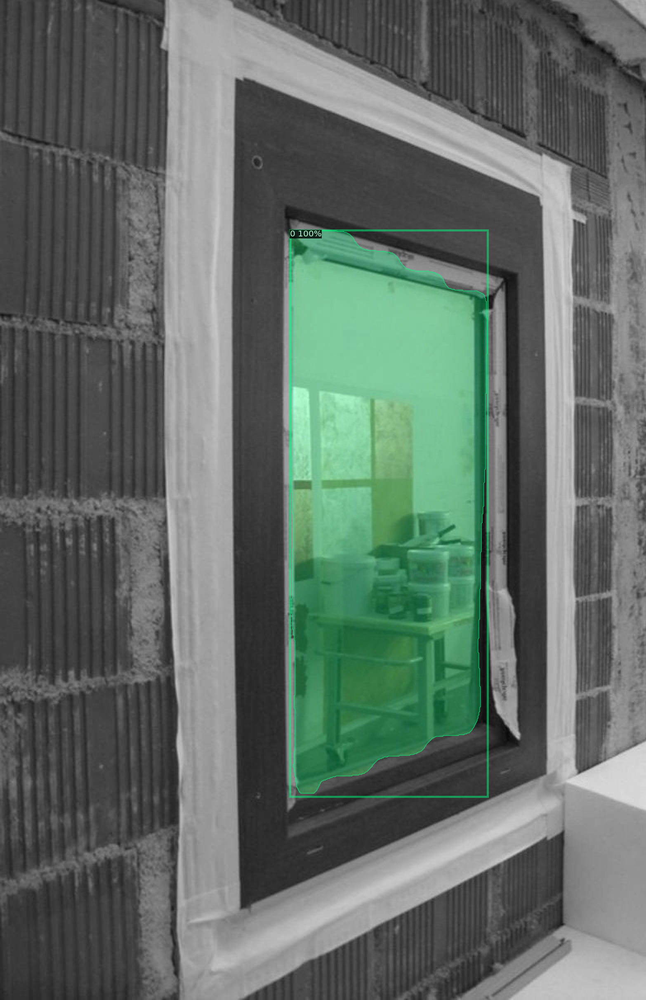

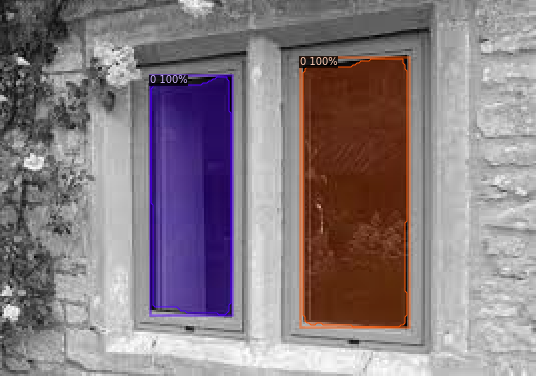

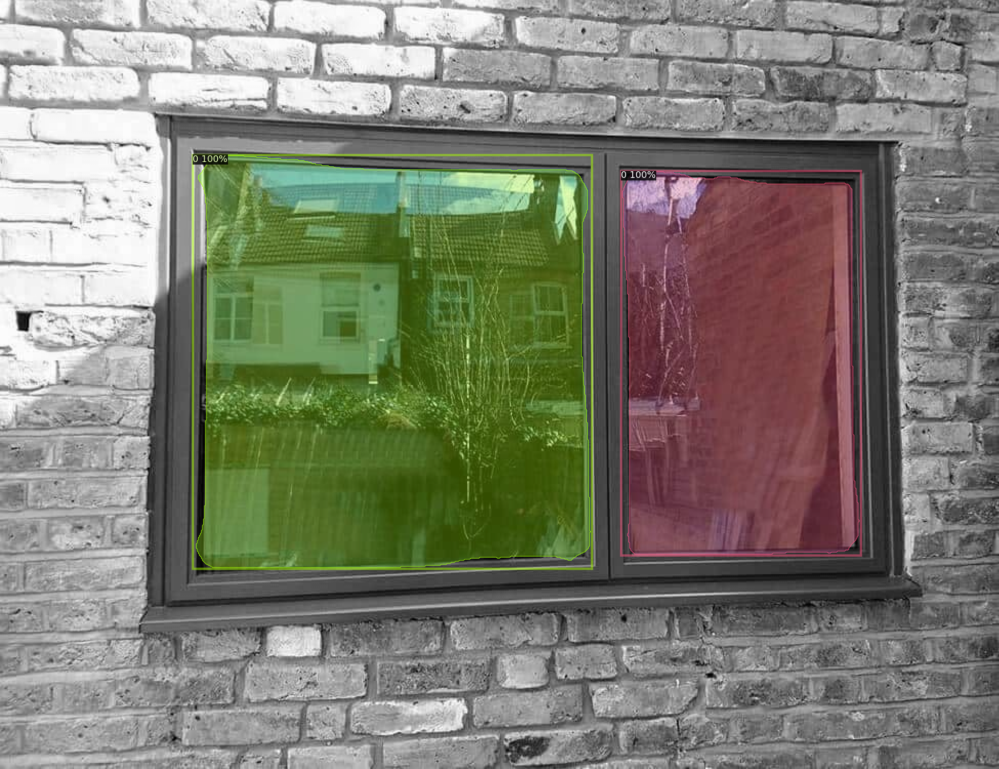

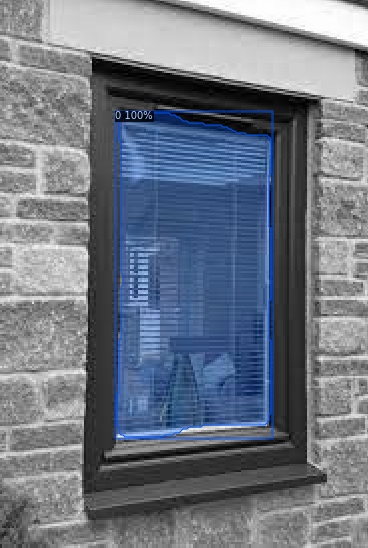

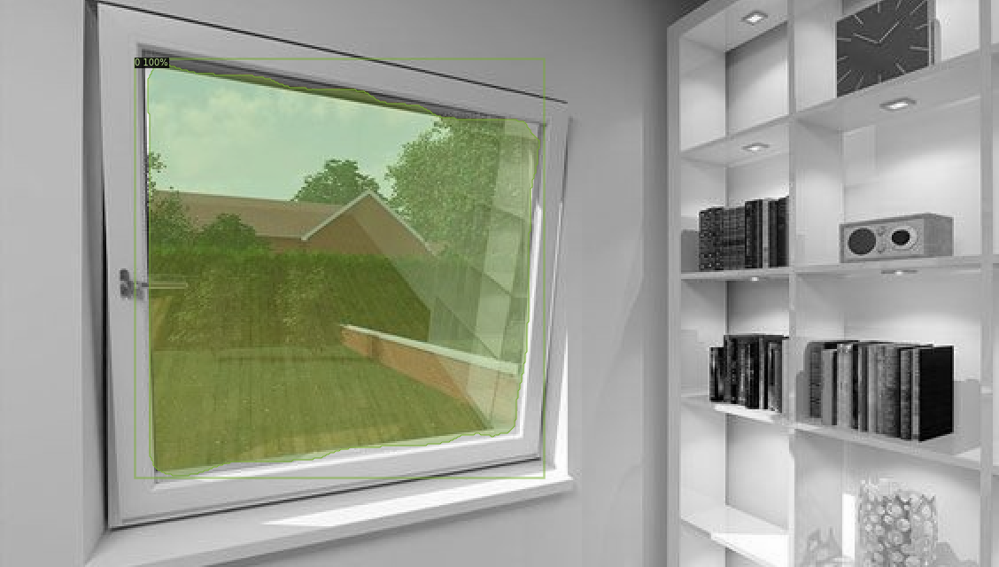

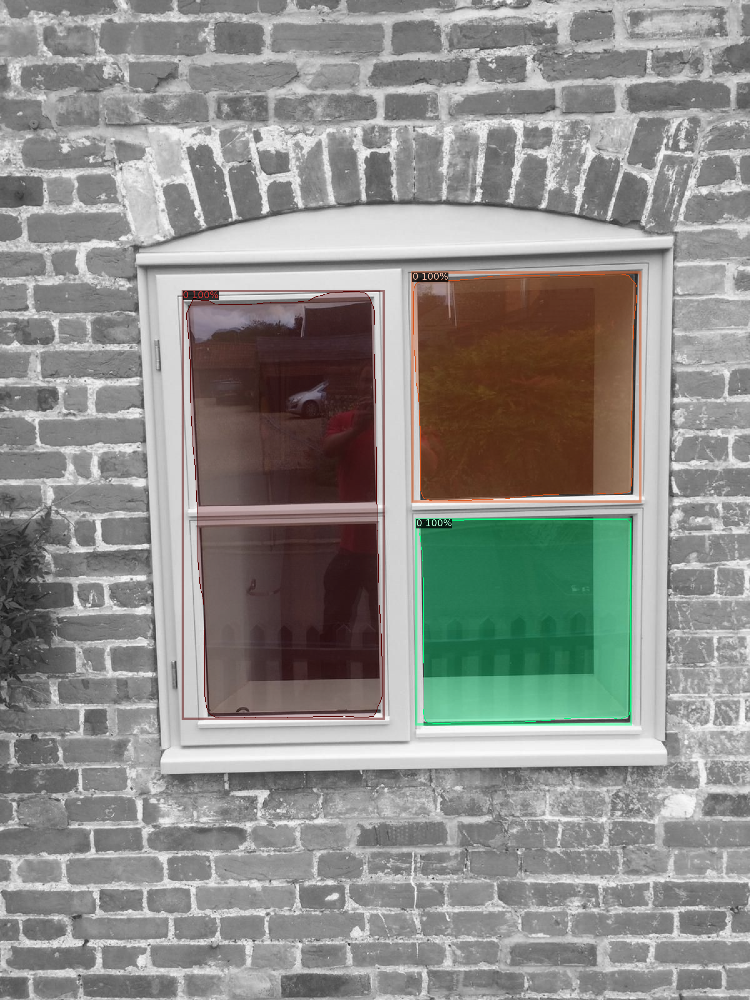

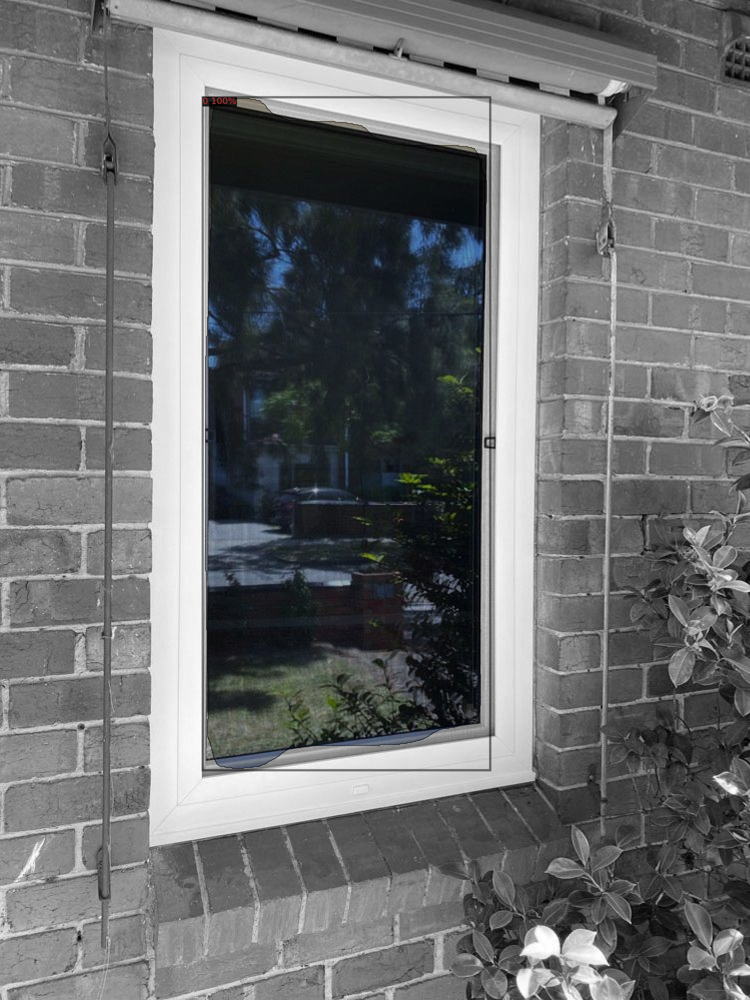

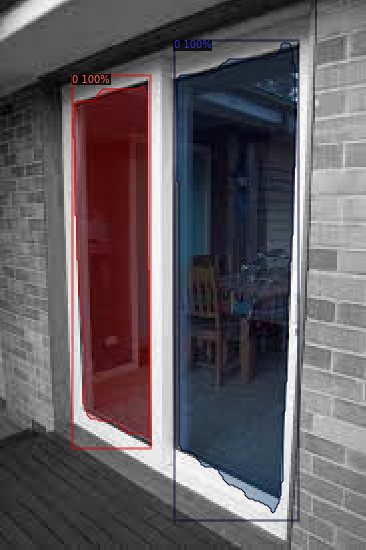

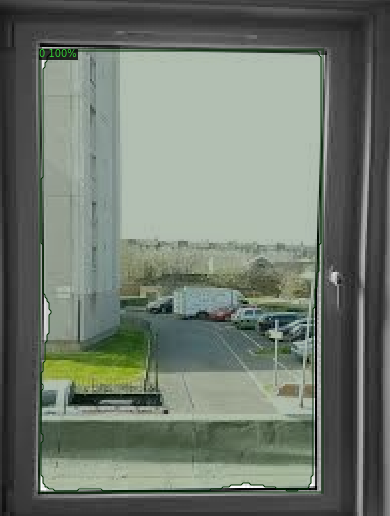

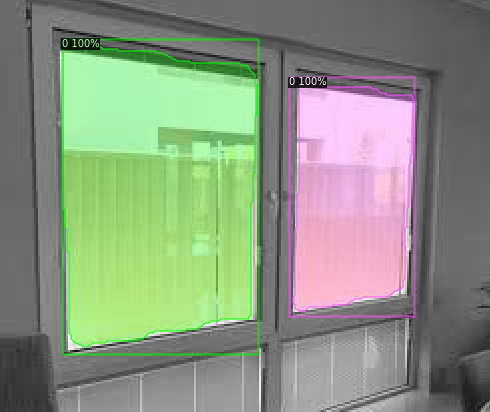

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = dekor_dict
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   scale=2.0, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val2", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val2")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[04/22 11:26:44 d2.data.datasets.coco]: Loaded 19 images in COCO format from validation.json
[04/22 11:26:44 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   Glass    | 38           |
|            |              |
[04/22 11:26:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[04/22 11:26:44 d2.data.common]: Serializing 19 elements to byte tensors and concatenating them all ...
[04/22 11:26:44 d2.data.common]: Serialized dataset takes 0.01 MiB
[04/22 11:26:44 d2.evaluation.evaluator]: Start inference on 19 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[04/22 11:26:48 d2.evaluation.evaluator]: Inference done 11/19. Dataloading: 0.0030 s/iter. Inference: 0.3481 s/iter. Eval: 0.0124 s/iter. Total: 0.3634 s/iter. ETA=0:00:02
[04/22 11:26:51 d2.evaluation.evaluator]: Total inference time: 0:00:04.871962 (0.347997 s / iter per device, on 1 devices)
[04/22 11:26:51 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.332498 s / iter per device, on 1 devices)
[04/22 11:26:51 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/22 11:26:51 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/22 11:26:51 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[04/22 11:26:51 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[04/22 11:26:51 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[04/22 11:26:51 d2.evaluation.

# Other types of builtin models

We showcase simple demos of other types of models below:

WARNING [10/15 06:33:32 d2.config.compat]: Config './detectron2_repo/configs/COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


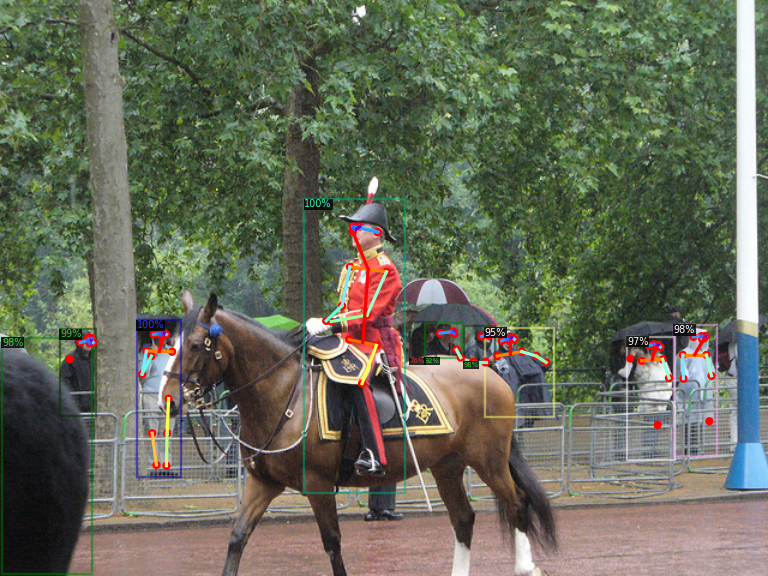

In [ ]:
# Inference with a keypoint detection model
cfg = get_cfg()   # get a fresh new config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

WARNING [10/15 06:33:37 d2.config.compat]: Config './detectron2_repo/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


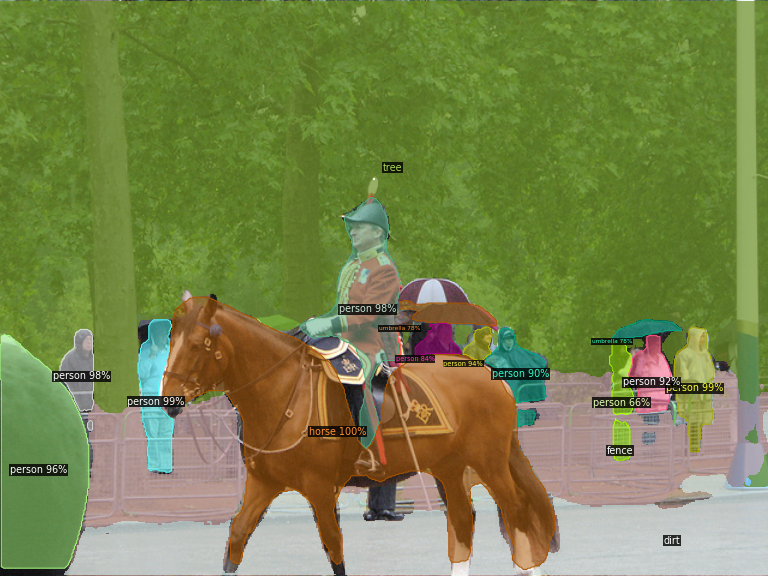

In [ ]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])

# Run panoptic segmentation on a video

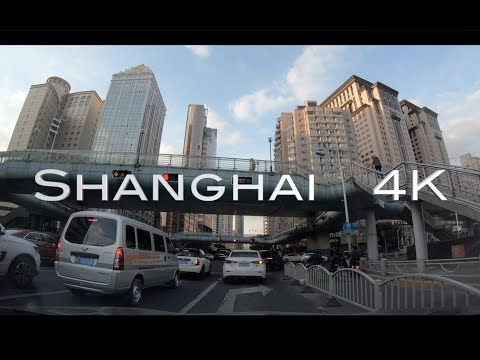

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("ll8TgCZ0plk", width=500)
display(video)

In [ ]:
# Install dependencies, download the video, and crop 5 seconds for processing
!pip install youtube-dl
!youtube-dl https://www.youtube.com/watch?v=ll8TgCZ0plk -f 22 -o video.mp4
!ffmpeg -i video.mp4 -t 00:00:06 -c:v copy video-clip.mp4

In [ ]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes) with the "demo.py" tool we provided in the repo.
!git clone https://github.com/facebookresearch/detectron2
# Note: this is currently BROKEN due to missing codec. See https://github.com/facebookresearch/detectron2/issues/2901 for workaround.
%run detectron2/demo/demo.py --config-file detectron2/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml --video-input video-clip.mp4 --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl

In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')